In [2]:
!pip install -U giotto-tda

In [3]:
!pip install nbformat 

In [4]:
!pip install librosa

In [5]:
!pip install h5py

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import h5py as h5py

from gtda.homology import VietorisRipsPersistence
from gtda.time_series import SingleTakensEmbedding
from gtda.diagrams import BettiCurve, PersistenceLandscape, PairwiseDistance
from gtda.plotting import plot_point_cloud, plot_diagram

Загрузка данных

In [3]:
with h5py.File("train.h5") as f:
    chunks = np.array(f["chunks"]) # Получили датасет "chunks"
    print(chunks.shape) # (2628, 5, 4410) - всего 2628 сэмплов, из каждого взяли по 5 фрагментов длины 4410 каждый
    classes = np.array(f["classes"])

(2628, 5, 4410)


In [4]:
# Выявили образцы всех 4 классов
print(classes[0])
print(classes[2])
print(classes[19])
print(classes[20])

drum = chunks[0, 0]
guitar = chunks[2, 0]
violin = chunks[19, 0]
piano = chunks[20, 0]


b'Sound_Drum'
b'Sound_Guitar'
b'Sound_Violin'
b'Sound_Piano'


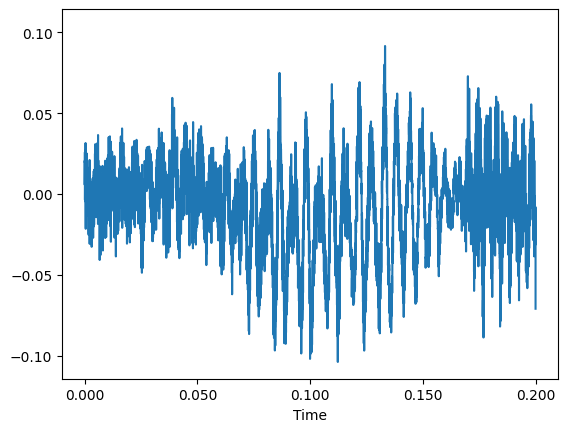

In [5]:
librosa.display.waveshow(drum)

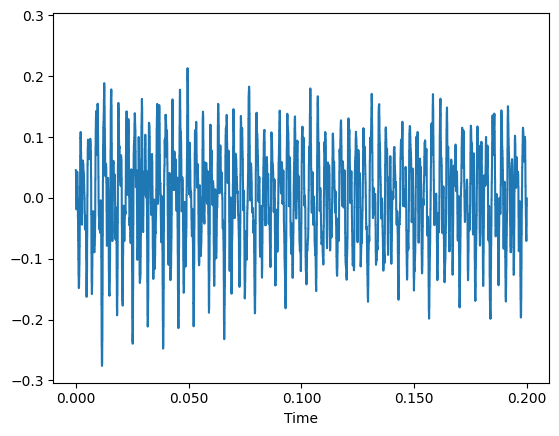

In [6]:
librosa.display.waveshow(guitar)

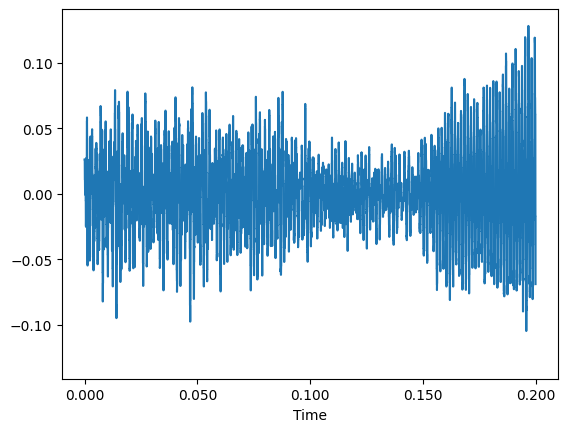

In [7]:
librosa.display.waveshow(violin)

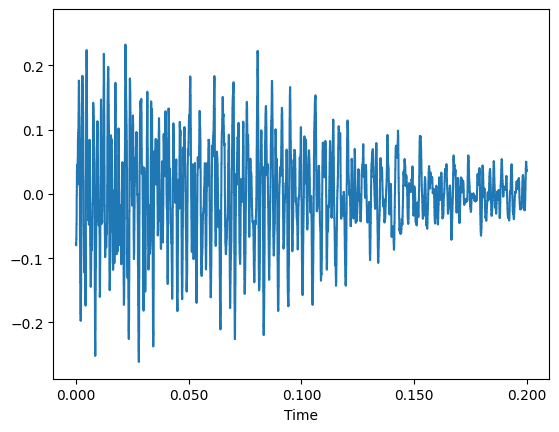

In [8]:
librosa.display.waveshow(piano)

Облака точек

In [40]:
# embedding_dimension_periodic отвечает за размерность (2-3) [2n+1]
# time_delay - период, через который отбираются точки для составления координат

# Вложение Такенса (одномерный ряд вкладывается в 3-х мерное пр-во n -> 2n+1)
embedding_dimension_periodic = 3
embedding_time_delay_periodic = 8 
embedder = SingleTakensEmbedding(
    parameters_type="fixed",
    time_delay=embedding_time_delay_periodic,
    dimension=embedding_dimension_periodic
)

drum_point_cloud = embedder.fit_transform(drum)
plot_point_cloud(drum_point_cloud)

In [41]:
guitar_point_cloud = embedder.fit_transform(guitar)
plot_point_cloud(guitar_point_cloud)

In [42]:
violin_point_cloud = embedder.fit_transform(violin)
plot_point_cloud(violin_point_cloud)

In [43]:
piano_point_cloud = embedder.fit_transform(piano)
plot_point_cloud(piano_point_cloud)

Построение диаграмм персистентности

In [17]:
# 0 - connected components, 1 - loops
# 0 - количество компонент связности, 1 - количество "дыр"

homology_dimensions = [0, 1]

persistence = VietorisRipsPersistence(
    homology_dimensions=homology_dimensions
)

diagrams = persistence.fit_transform([drum_point_cloud, guitar_point_cloud, violin_point_cloud, piano_point_cloud])

VR = VietorisRipsPersistence()
# drum
VR.plot(diagrams, sample = 0)

In [56]:
# guitar
VR.plot(diagrams, sample = 1)

In [57]:
# violin
VR.plot(diagrams, sample = 2)

In [58]:
# piano
VR.plot(diagrams, sample = 3)

Измерение расстояний между диаграммами персистентности

In [59]:
# Метрика Вассерштайна
p_W = 2
PD = PairwiseDistance(metric='wasserstein',
                      metric_params={'p': p_W, 'delta': 0.1},
                      order=None)

PD.fit_transform(diagrams)

array([[[0.        , 0.        ],
        [0.41615719, 0.11912815],
        [0.08552128, 0.02660184],
        [0.43238531, 0.1290514 ]],

       [[0.41580662, 0.11911644],
        [0.        , 0.        ],
        [0.39408636, 0.11549351],
        [0.15623846, 0.0848565 ]],

       [[0.08545262, 0.02660253],
        [0.39400883, 0.11549889],
        [0.        , 0.        ],
        [0.41315066, 0.12483401]],

       [[0.43170289, 0.12904644],
        [0.15641432, 0.08497223],
        [0.41192119, 0.12484431],
        [0.        , 0.        ]]])

In [60]:
# Метрика узкого места
PD = PairwiseDistance(metric='bottleneck',
                      metric_params={'delta': 0.1},
                      order=None)

PD.fit_transform(diagrams)

array([[[0.        , 0.        ],
        [0.02303495, 0.01309419],
        [0.00949517, 0.00378838],
        [0.02734827, 0.02431904]],

       [[0.02167866, 0.01311664],
        [0.        , 0.        ],
        [0.02475902, 0.01305534],
        [0.0102556 , 0.02431904]],

       [[0.00969835, 0.00378365],
        [0.0246803 , 0.01285871],
        [0.        , 0.        ],
        [0.03320861, 0.02431904]],

       [[0.02743516, 0.02403399],
        [0.0106948 , 0.02420354],
        [0.03135446, 0.02399198],
        [0.        , 0.        ]]])

Кривые Бетти

In [61]:
BC = BettiCurve()
betti_curves = BC.fit_transform(diagrams)
for j in range(len(diagrams)):
    for i in range(len(betti_curves[j][0])):
        betti_curves[j][0][i]+=1

# drum
BC.plot(betti_curves, sample=0)

In [62]:
# guitar
BC.plot(betti_curves, sample=1)

In [63]:
# violin
BC.plot(betti_curves, sample=2)

In [64]:
# piano
BC.plot(betti_curves, sample=3)

In [65]:
PD = PairwiseDistance(metric='betti',
                      metric_params={'p': 1},
                      order=None)

PD.fit_transform(diagrams)

array([[[ 0.        ,  0.        ],
        [35.01881969, 10.00404697],
        [ 5.2662832 ,  1.74772283],
        [32.31410123,  8.02952747]],

       [[35.01881969, 10.00404697],
        [ 0.        ,  0.        ],
        [29.83488155,  9.82075824],
        [ 9.11496455,  5.0978335 ]],

       [[ 5.2662832 ,  1.74772283],
        [29.83488155,  9.82075824],
        [ 0.        ,  0.        ],
        [27.13016309,  7.37228001]],

       [[32.31410123,  8.02952747],
        [ 9.11496455,  5.0978335 ],
        [27.13016309,  7.37228001],
        [ 0.        ,  0.        ]]])

Ландшафты персистентности

In [66]:
PL = PersistenceLandscape()
persistence_landscapes = PL.fit_transform(diagrams)
# drum
PL.plot(persistence_landscapes, sample=0)

In [67]:
# guitar
PL.plot(persistence_landscapes, sample=1)

In [68]:
# violin
PL.plot(persistence_landscapes, sample=2)

In [69]:
# piano
PL.plot(persistence_landscapes, sample=2)

In [70]:
PD = PairwiseDistance(metric='landscape',
                      metric_params={'p': 1},
                      order=None)

PD.fit_transform(diagrams)

array([[[0.00000000e+00, 0.00000000e+00],
        [3.61924635e-04, 3.90038530e-04],
        [1.23959000e-04, 3.33462219e-05],
        [6.47496528e-04, 9.59701235e-04]],

       [[3.61924635e-04, 3.90038530e-04],
        [0.00000000e+00, 0.00000000e+00],
        [4.85883635e-04, 3.64406220e-04],
        [2.85571893e-04, 6.17733896e-04]],

       [[1.23959000e-04, 3.33462219e-05],
        [4.85883635e-04, 3.64406220e-04],
        [0.00000000e+00, 0.00000000e+00],
        [7.71455528e-04, 9.29437324e-04]],

       [[6.47496528e-04, 9.59701235e-04],
        [2.85571893e-04, 6.17733896e-04],
        [7.71455528e-04, 9.29437324e-04],
        [0.00000000e+00, 0.00000000e+00]]])

Те же вычисления с другим параметром embedding_time_delay_periodic = 4

In [18]:
# Вложение Такенса (одномерный ряд вкладывается в 3-х мерное пр-во n -> 2n+1)
embedding_dimension_periodic = 3
embedding_time_delay_periodic = 4 
embedder = SingleTakensEmbedding(
    parameters_type="fixed",
    time_delay=embedding_time_delay_periodic,
    dimension=embedding_dimension_periodic
)

drum_point_cloud = embedder.fit_transform(drum)
plot_point_cloud(drum_point_cloud)

In [19]:
guitar_point_cloud = embedder.fit_transform(guitar)
plot_point_cloud(guitar_point_cloud)

In [20]:
violin_point_cloud = embedder.fit_transform(violin)
plot_point_cloud(violin_point_cloud)

In [21]:
piano_point_cloud = embedder.fit_transform(piano)
plot_point_cloud(piano_point_cloud)

In [22]:
diagrams = persistence.fit_transform([drum_point_cloud, guitar_point_cloud, violin_point_cloud, piano_point_cloud])
# drum
VR.plot(diagrams, sample = 0)

In [23]:
# guitar
VR.plot(diagrams, sample = 1)

In [24]:
# violin
VR.plot(diagrams, sample = 2)

In [25]:
# piano
VR.plot(diagrams, sample = 3)

In [27]:
# Метрика Вассерштайна
p_W = 2
PD = PairwiseDistance(metric='wasserstein',
                      metric_params={'p': p_W, 'delta': 0.1},
                      order=None)

PD.fit_transform(diagrams)

array([[[0.        , 0.        ],
        [0.3132022 , 0.0802589 ],
        [0.09073954, 0.02646325],
        [0.34608999, 0.07660505]],

       [[0.31257126, 0.08026022],
        [0.        , 0.        ],
        [0.2781121 , 0.07302468],
        [0.15075832, 0.05248842]],

       [[0.09076409, 0.02654112],
        [0.2780526 , 0.07302051],
        [0.        , 0.        ],
        [0.31951202, 0.07308147]],

       [[0.34598571, 0.0766095 ],
        [0.15091221, 0.05250271],
        [0.31960591, 0.07308937],
        [0.        , 0.        ]]])

In [28]:
# Метрика узкого места
PD = PairwiseDistance(metric='bottleneck',
                      metric_params={'delta': 0.1},
                      order=None)

PD.fit_transform(diagrams)

array([[[0.        , 0.        ],
        [0.02250278, 0.00940947],
        [0.00355651, 0.0024555 ],
        [0.03555673, 0.01263341]],

       [[0.02255725, 0.00962913],
        [0.        , 0.        ],
        [0.02416848, 0.00958922],
        [0.01777836, 0.01263341]],

       [[0.00345796, 0.00240355],
        [0.0240496 , 0.00934706],
        [0.        , 0.        ],
        [0.03555673, 0.01263341]],

       [[0.03351638, 0.01255312],
        [0.01765311, 0.0121919 ],
        [0.03351638, 0.01307756],
        [0.        , 0.        ]]])

In [29]:
PD = PairwiseDistance(metric='betti',
                      metric_params={'p': 1},
                      order=None)

PD.fit_transform(diagrams)

array([[[ 0.        ,  0.        ],
        [23.97200167,  6.92154222],
        [ 5.54746949,  1.91906819],
        [22.73697368,  4.9043863 ]],

       [[23.97200167,  6.92154222],
        [ 0.        ,  0.        ],
        [18.52880538,  6.08143901],
        [ 8.24706192,  3.76093771]],

       [[ 5.54746949,  1.91906819],
        [18.52880538,  6.08143901],
        [ 0.        ,  0.        ],
        [17.30596516,  4.57106967]],

       [[22.73697368,  4.9043863 ],
        [ 8.24706192,  3.76093771],
        [17.30596516,  4.57106967],
        [ 0.        ,  0.        ]]])

In [30]:

PD = PairwiseDistance(metric='landscape',
                      metric_params={'p': 1},
                      order=None)

PD.fit_transform(diagrams)

array([[[0.00000000e+00, 0.00000000e+00],
        [4.46004292e-04, 2.71158480e-04],
        [1.44358825e-05, 2.13384670e-05],
        [9.04646614e-04, 5.39120991e-04]],

       [[4.46004292e-04, 2.71158480e-04],
        [0.00000000e+00, 0.00000000e+00],
        [4.60440175e-04, 2.67427673e-04],
        [4.58642322e-04, 3.06885555e-04]],

       [[1.44358825e-05, 2.13384670e-05],
        [4.60440175e-04, 2.67427673e-04],
        [0.00000000e+00, 0.00000000e+00],
        [9.19082497e-04, 5.35773877e-04]],

       [[9.04646614e-04, 5.39120991e-04],
        [4.58642322e-04, 3.06885555e-04],
        [9.19082497e-04, 5.35773877e-04],
        [0.00000000e+00, 0.00000000e+00]]])

Те же вычисления с другим параметром embedding_time_delay_periodic = 14

In [31]:
# Вложение Такенса (одномерный ряд вкладывается в 3-х мерное пр-во n -> 2n+1)
embedding_dimension_periodic = 3
embedding_time_delay_periodic = 14 
embedder = SingleTakensEmbedding(
    parameters_type="fixed",
    time_delay=embedding_time_delay_periodic,
    dimension=embedding_dimension_periodic
)

drum_point_cloud = embedder.fit_transform(drum)
plot_point_cloud(drum_point_cloud)

In [32]:
guitar_point_cloud = embedder.fit_transform(guitar)
plot_point_cloud(guitar_point_cloud)

In [33]:
violin_point_cloud = embedder.fit_transform(violin)
plot_point_cloud(violin_point_cloud)

In [34]:
piano_point_cloud = embedder.fit_transform(piano)
plot_point_cloud(piano_point_cloud)

In [35]:
diagrams = persistence.fit_transform([drum_point_cloud, guitar_point_cloud, violin_point_cloud, piano_point_cloud])

In [36]:
# Метрика Вассерштайна
p_W = 2
PD = PairwiseDistance(metric='wasserstein',
                      metric_params={'p': p_W, 'delta': 0.1},
                      order=None)

PD.fit_transform(diagrams)

array([[[0.        , 0.        ],
        [0.36929065, 0.11963503],
        [0.04877923, 0.0184815 ],
        [0.38739079, 0.13736   ]],

       [[0.36909596, 0.11962195],
        [0.        , 0.        ],
        [0.35599864, 0.11863683],
        [0.1597364 , 0.09220106]],

       [[0.04877038, 0.01847774],
        [0.3562234 , 0.11863827],
        [0.        , 0.        ],
        [0.37502987, 0.13618331]],

       [[0.3875629 , 0.13736487],
        [0.15970999, 0.09204083],
        [0.37480798, 0.13618625],
        [0.        , 0.        ]]])

In [37]:
# Метрика узкого места
PD = PairwiseDistance(metric='bottleneck',
                      metric_params={'delta': 0.1},
                      order=None)

PD.fit_transform(diagrams)

array([[[0.        , 0.        ],
        [0.02134608, 0.0161247 ],
        [0.00332526, 0.00556315],
        [0.02508957, 0.03323687]],

       [[0.02147048, 0.01617237],
        [0.        , 0.        ],
        [0.01860775, 0.01633457],
        [0.0117417 , 0.03304925]],

       [[0.00330213, 0.00566033],
        [0.01851474, 0.01701433],
        [0.        , 0.        ],
        [0.02196932, 0.03310481]],

       [[0.02522227, 0.03323687],
        [0.01207188, 0.03304925],
        [0.02206949, 0.03310481],
        [0.        , 0.        ]]])

In [38]:
PD = PairwiseDistance(metric='betti',
                      metric_params={'p': 1},
                      order=None)

PD.fit_transform(diagrams)

array([[[ 0.        ,  0.        ],
        [30.77575732,  9.57443156],
        [ 3.06743587,  1.02975212],
        [28.67542997,  8.01735582]],

       [[30.77575732,  9.57443156],
        [ 0.        ,  0.        ],
        [27.75723737,  9.55179964],
        [ 8.58576319,  4.90207275]],

       [[ 3.06743587,  1.02975212],
        [27.75723737,  9.55179964],
        [ 0.        ,  0.        ],
        [25.65691002,  7.71182497]],

       [[28.67542997,  8.01735582],
        [ 8.58576319,  4.90207275],
        [25.65691002,  7.71182497],
        [ 0.        ,  0.        ]]])

In [39]:

PD = PairwiseDistance(metric='landscape',
                      metric_params={'p': 1},
                      order=None)

PD.fit_transform(diagrams)

array([[[0.00000000e+00, 0.00000000e+00],
        [3.24129874e-04, 4.49621277e-04],
        [3.24544628e-05, 3.88017167e-05],
        [4.35734156e-04, 1.61519312e-03]],

       [[3.24129874e-04, 4.49621277e-04],
        [0.00000000e+00, 0.00000000e+00],
        [2.91675411e-04, 4.24022880e-04],
        [1.11604282e-04, 1.20629198e-03]],

       [[3.24544628e-05, 3.88017167e-05],
        [2.91675411e-04, 4.24022880e-04],
        [0.00000000e+00, 0.00000000e+00],
        [4.03279693e-04, 1.58926272e-03]],

       [[4.35734156e-04, 1.61519312e-03],
        [1.11604282e-04, 1.20629198e-03],
        [4.03279693e-04, 1.58926272e-03],
        [0.00000000e+00, 0.00000000e+00]]])